<a href="https://colab.research.google.com/github/AndrewLittle2194/Bandcamp/blob/main/AndrewLittle_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
#@title


# Get the datetime module for handling date strings
import datetime

#0.2 * variable

# Get the BeautifulSoup4 module for parsing web pages
import bs4

# Get the requests module for getting web pages from the internet
import requests

# Get other url parsing stuff
import urllib.parse as urlparse
from urllib.parse import urlencode
from urllib.parse import urljoin
import re
from re import search
from re import IGNORECASE

# Get pandas DataFrame
from pandas import DataFrame
from pandas import Categorical
from pandas import read_csv
from pandas import to_datetime
from pandas import Series
import pandas as pd

# Get sleep
from time import sleep

import random

from mizani.breaks import date_breaks
from google.colab import files
import numpy as np
from collections import Counter

In [8]:
#@title
from plotnine import *

In [ ]:
#@title
from google.colab import drive
drive.mount("/content/drive")

In [10]:
#@title
newdf = read_csv("/content/drive/MyDrive/NEW_df.csv", parse_dates=["date"])
newdf['date2'] = to_datetime(newdf['date2'])
newdf["months2"] = [d.month for d in newdf["date2"]]
newdf["year2"] = [d.year for d in newdf["date2"]]
merchdf = DataFrame({"year":[2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020],
                     "percentage":[3.85,5.10,2.10,4.74,4.43,4.85,5.20,5.75,8.08,9.47,10.55,13.64]})
tracksdf = DataFrame({"year":[2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020],
                     "percentage":[29.93,30.05,30.03,39.19,33.95,35.81,33.93,37.35,35.33,35.48,40.16]})
avgdf = DataFrame({"year":[2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020],
                     "average":[2.66,2.16,2.47,2.48,2.34,2.70,2.57,2.85,2.81,3.55,5.27]})
totaldf = DataFrame({"year":[2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020],
                     "total":[26,137,346,569,699,701,793,834,929,951,947,2124],
                   "x":[5,5,5,5,5,5,5,5,5,5,5,5]})


# How Bandcamp Musicians Responded to 2020

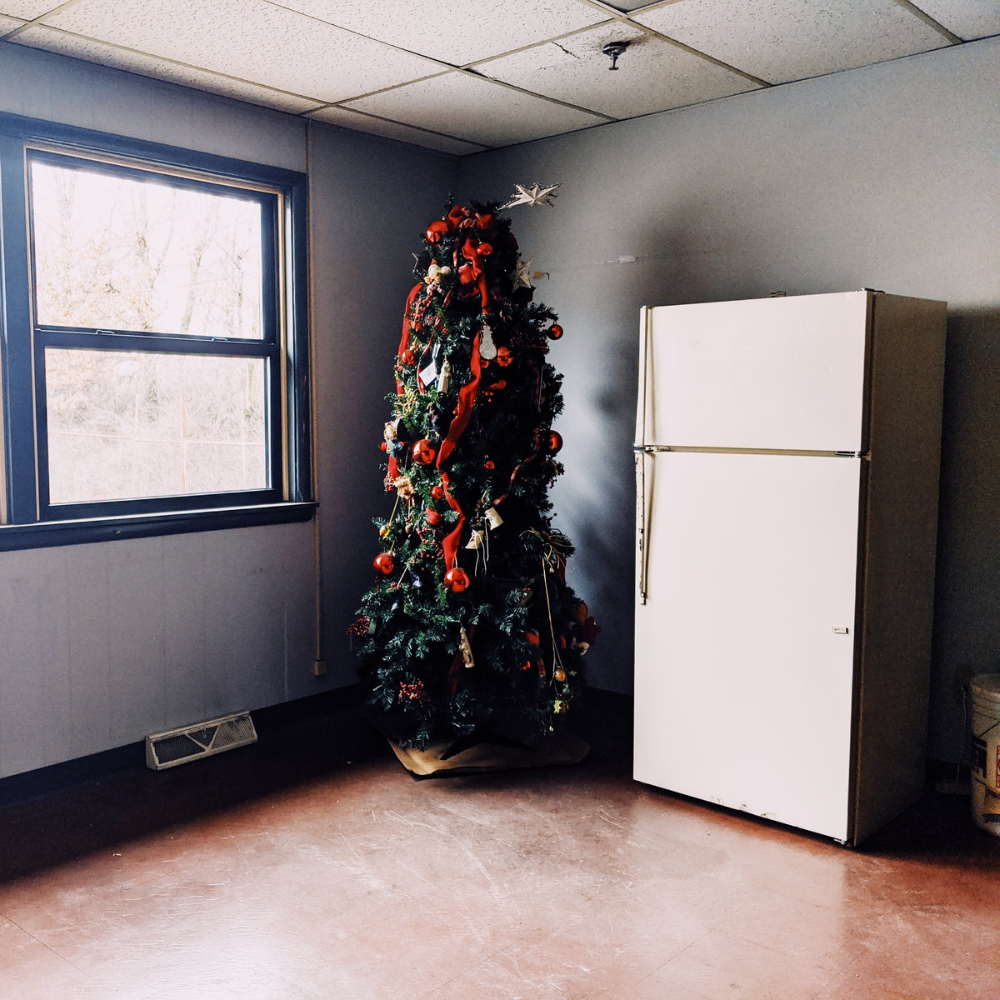

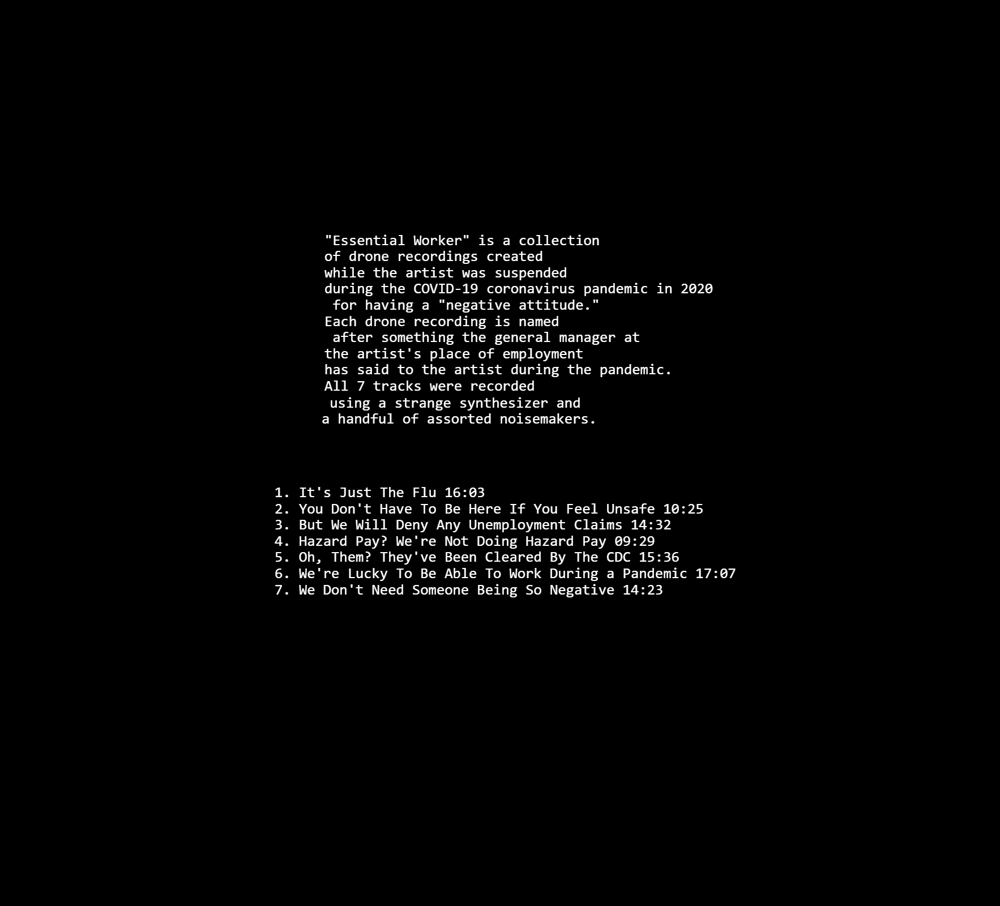

When the pandemic hit in March, 2020 and live events around the world were cancelled for the foreseeable future, musicians -- particularly smaller, independent ones -- knew their chances at making a livlihood had decreased drastically. 

Without live events, which make up 30 percent of the average musician's income in the U.S. according to a study done by the Future of Music Coalition, musicians turned to alternatives: livestreaming performances, launching
subscriptions for offering fans exclusive content, creating new merchandise. Anything to make it through what would be a historically testing year. 

Aligning with these efforts, the online music platform Bandcamp announced it would waive its revenue share on all purchases made on the website on March 20, 2020. Already seen as an artist-friendly platform that allows musicians more financial control over their music, the move brought even more attention to the company as a place that puts artists over profit. Over 2020, the website has continued to do so one Friday per month, calling it "Bandcamp Friday".

/usr/local/lib/python3.7/dist-packages/plotnine/scales/scales.py:29: PlotnineWarning: Scale for 'x' is already present.
Adding another scale for 'x',
which will replace the existing scale.

  warn(_TPL_DUPLICATE_SCALE.format(ae), PlotnineWarning)
/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):


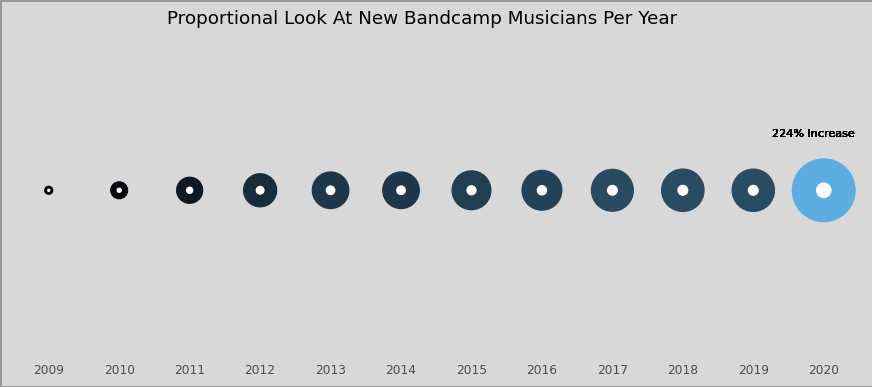

<ggplot: (8746603967377)>

In [ ]:
#@title
(ggplot(totaldf) 
+ geom_point(aes("year","x",size="total",colour="total"),shape="o",show_legend=False) 
+ scale_color_gradient(low='black', high='#5DADE2')

+ geom_point(aes("year","x",size=".2*total"),colour="white",shape=".",show_legend=False)

+ geom_text(aes(x=2019.85,y=7,label="'224% Increase'"),size=8)

+ ggtitle("Proportional Look At New Bandcamp Musicians Per Year")
+ xlab("")
+ ylab("")
+ labs(size="Counts")


+ scale_size_area(max_size=25)
+ ylim(0,10)
+ xlim(2011,2021)

+ theme_minimal()

+ theme(
    figure_size=(11, 4),
panel_grid=element_blank(),    
plot_background=element_rect(fill='gray', alpha=.3),
legend_position="bottom",
legend_direction="horizontal",
legend_title_align="center",
legend_box_spacing=1,
legend_entry_spacing_x=10,
axis_text_y=element_blank()

)
+ scale_x_continuous(breaks=[2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020])
)


Whether due to the new chances artists had to make extra money on the platform or the extra time people had due to rising unemployment and work-from-home measures - most likely a mixture - the number of artists that uploaded music to Bandcamp doubled in 2020 compared to 2019 according to a random sampling of 10,000 musicians from the website's artist index page. 

Not only did new artists join, but artist's discographies uploaded during the year became larger than any other year on the platform, merchandise displays on artists pages increased, and uploads of single tracks jumped as well. 

The genre that saw the greatest increase in usage was pop music, and other notable genres that were used for the first time by musicians included "hyperpop" and "drill".

Artists selling merchandise on Bandcamp increased by approximately 30 percent in 2020 from 2019, the greatest year-on-year percentage increase since 2017. The most popular items to sell - CDs, cassette tapes, vinyl - didn't change, but new items like face masks started popping up.

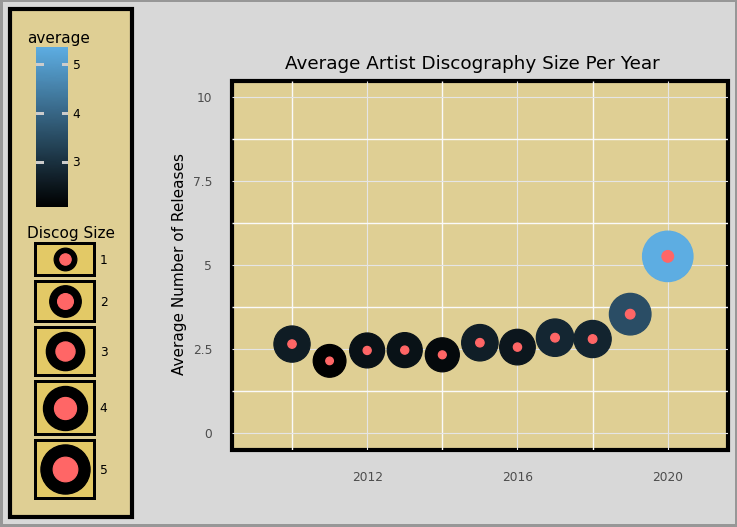

<ggplot: (8746609324573)>

In [ ]:
#@title

(ggplot(avgdf) 
+ geom_point(aes("year","average",size="average",colour="average"),shape="o") 
+ scale_color_gradient(low='black', high='#5DADE2')

+ geom_point(aes("year","average",size=".2*average"),colour="#ff6666",shape=".")

+ ggtitle("Average Artist Discography Size Per Year")
+ xlab("")
+ ylab("Average Number of Releases")
+ labs(size="Discog Size")


+ scale_size_area(max_size=20)
+ ylim(0,10)
+ xlim(2009,2021)

+ theme_minimal()
+ theme(
    rect=element_rect(color="black", size=3, fill='#EEBB0050'),
plot_background=element_rect(fill='gray', alpha=.3),
legend_position="left",
legend_direction="vertical",
legend_title_align="center",
legend_box_spacing=1,
legend_entry_spacing_x=10
)
)

/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


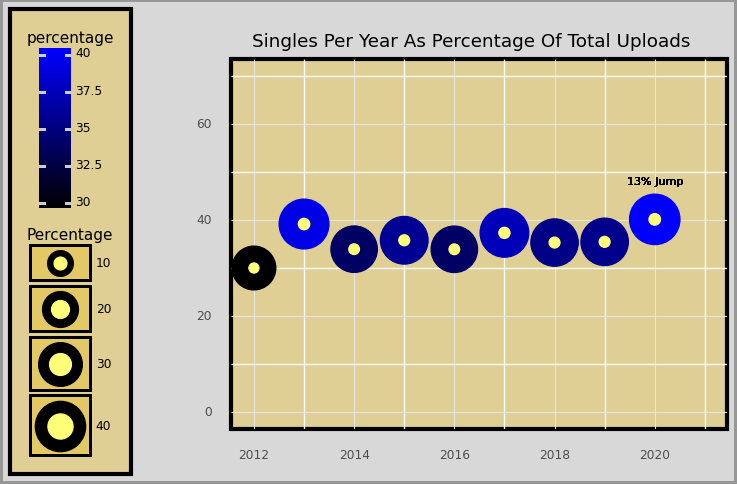

<ggplot: (8746603423609)>

In [ ]:
#@title
(ggplot(tracksdf) 
+ geom_point(aes("year","percentage",label='percentage',size="percentage",colour="percentage"),shape="o") 
+ scale_color_gradient(low='black', high='blue')

+ geom_point(aes("year","percentage",label='percentage',size=".2*percentage"),colour="#ffff7a",shape=".")

+ geom_text(aes(x=2018.5,y=14,label="''"),size=10)

+ geom_text(aes(x=2020,y=48,label="'13% Jump'"),size=8)

+ ggtitle("Singles Per Year As Percentage Of Total Uploads")
+ xlab("")
+ ylab("")
+ labs(size="Percentage")


+ scale_size_area(max_size=20)
+ ylim(0,70)
+ xlim(2012,2021)

+ theme_minimal()

+ theme(
rect=element_rect(color="black", size=3, fill='#EEBB0050'),
plot_background=element_rect(fill='gray', alpha=.3),
legend_position="left",
legend_direction="vertical",
legend_title_align="center",
legend_box_spacing=1,
legend_entry_spacing_x=10
)
)

/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 3 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 3 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


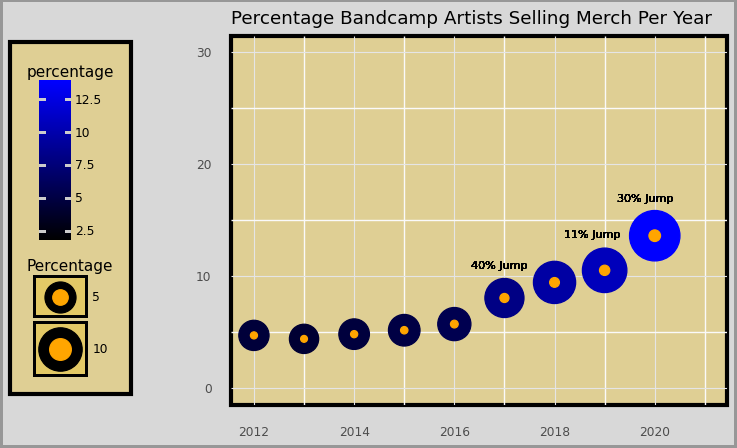

<ggplot: (8746603422781)>

In [ ]:
#@title
(ggplot(merchdf) 
+ geom_point(aes("year","percentage",size="percentage",colour="percentage"),shape="o") 
+ scale_color_gradient(low='black', high='blue')

+ geom_point(aes("year","percentage",size=".2*percentage"),colour="orange",shape=".")

+ geom_text(aes(x=2018.75,y=13.75,label="'11% Jump'"),size=8)

+ geom_text(aes(x=2019.8,y=17,label="'30% Jump'"),size=8)

+ geom_text(aes(x=2016.9,y=11,label="'40% Jump'"),size=8)

+ ggtitle("Percentage Bandcamp Artists Selling Merch Per Year")
+ xlab("")
+ ylab("")
+ labs(size="Percentage")


+ scale_size_area(max_size=20)
+ ylim(0,30)
+ xlim(2012,2021)

+ theme_minimal()
+ theme(
    rect=element_rect(color="black", size=3, fill='#EEBB0050'),
plot_background=element_rect(fill='gray', alpha=.3),
legend_position="left",
legend_direction="vertical",
legend_title_align="center",
legend_box_spacing=1,
legend_entry_spacing_x=10
)
)

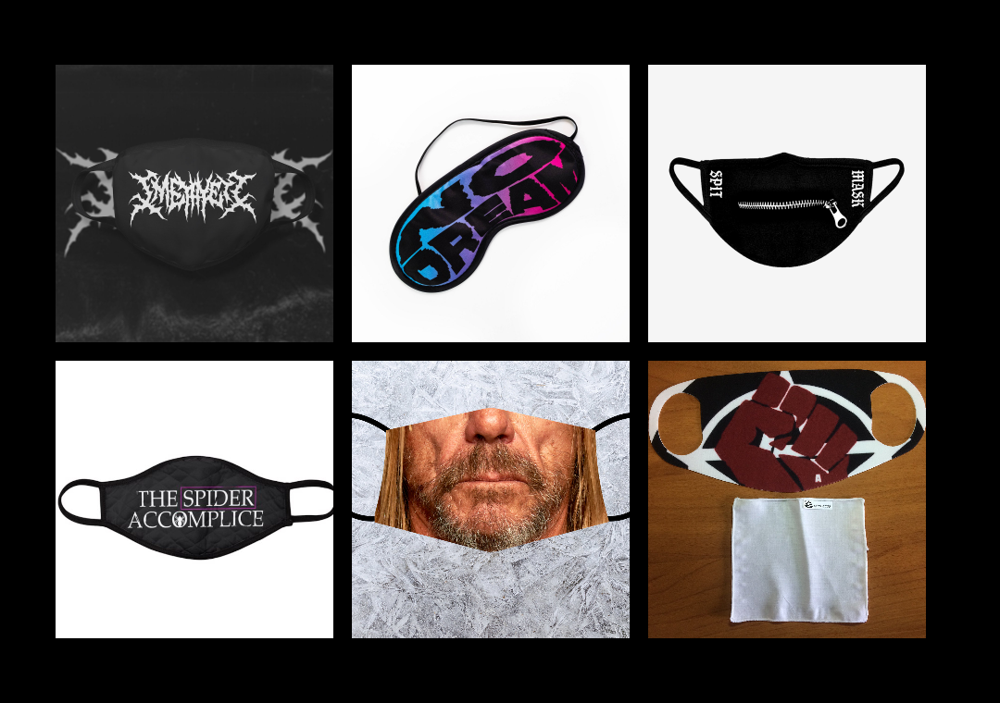

Other than the dry numbers, musicians' artistic expression also responded to what was happening during the year. 

Some musicians incorporated pandemic-themed art and messages into their music, adding tags like "quarantine" (the most popular), "pandemic" or "essential worker" to their albums or tracks. Tags related to racial justice like "Black Lives Matter" were also used more frequently than other years.

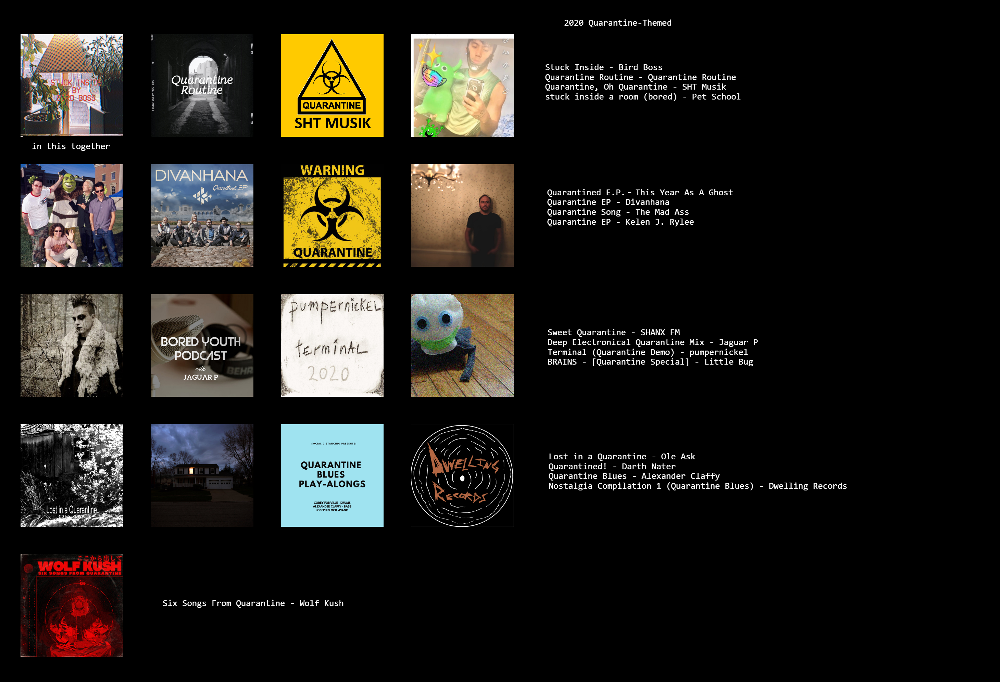

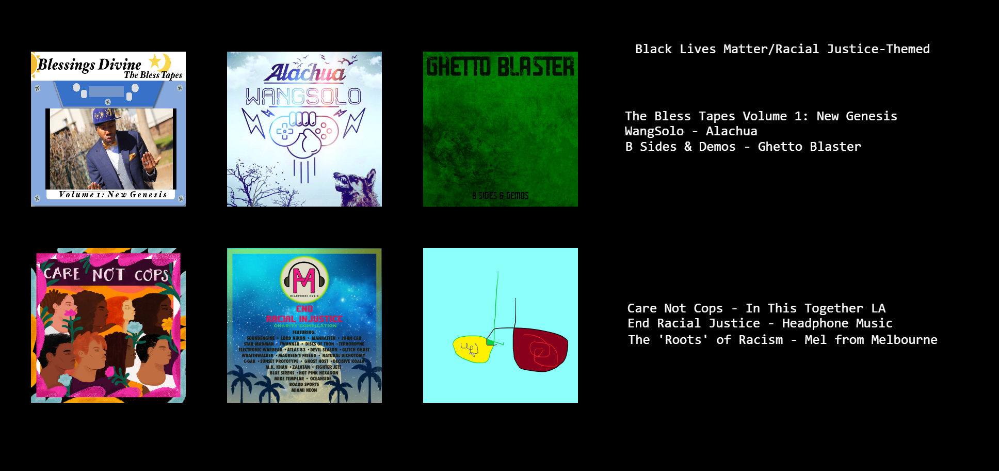

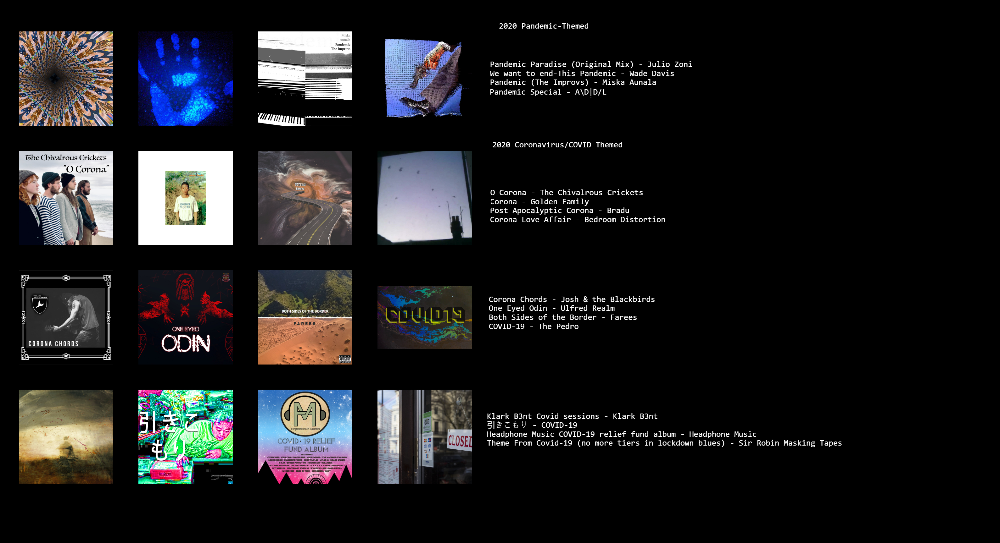

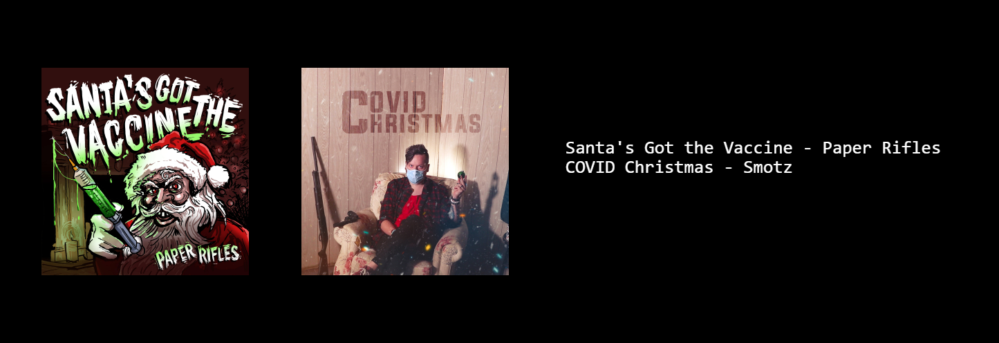

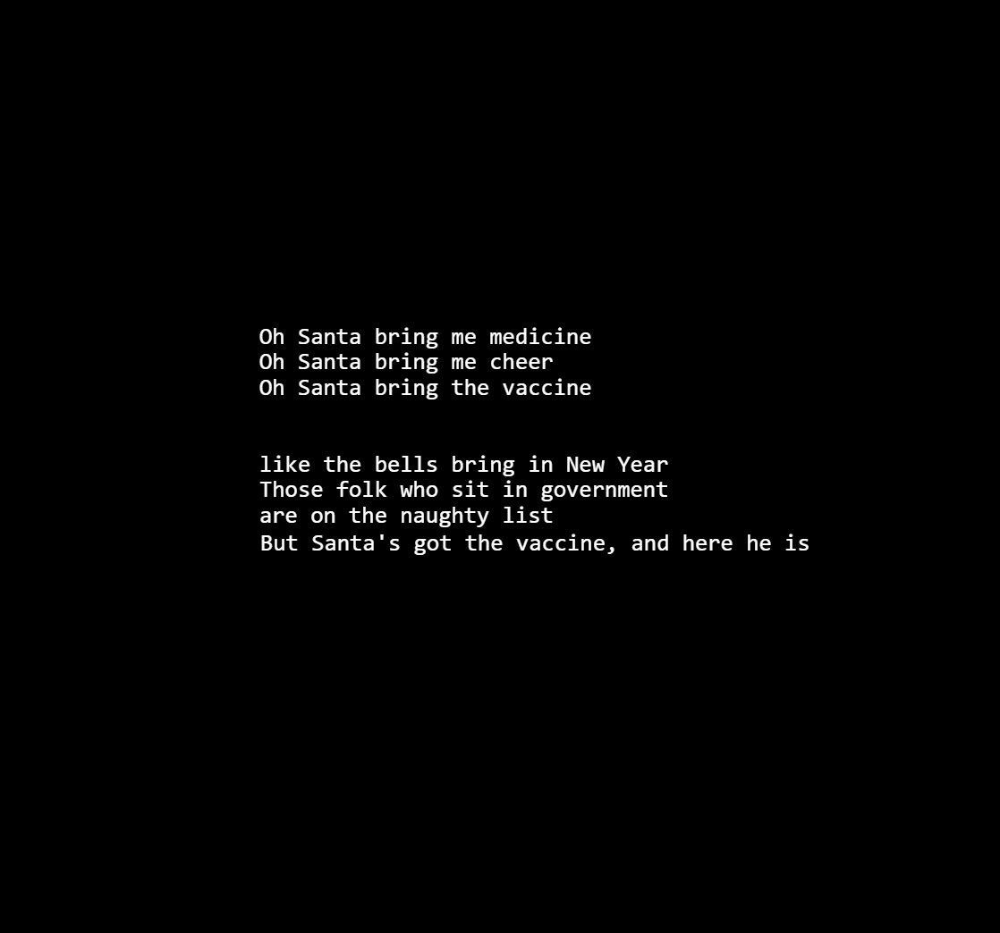